## Libraries 

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas import Series, DataFrame
from pandas.plotting import scatter_matrix
import seaborn as sns
import scipy.stats as stats
import matplotlib.patches as patches
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge, LinearRegression, Lasso, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import Normalizer, MinMaxScaler, StandardScaler, RobustScaler, PowerTransformer, OneHotEncoder
from sklearn.metrics import classification_report
from sklearn.svm import SVC, LinearSVC
from sklearn.utils import shuffle
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif
from sklearn.feature_selection import f_regression, f_classif
from sklearn.feature_selection import SelectKBest, SelectPercentile, SelectFpr
#from fancyimpute import SimpleFill, KNN, SoftImpute, IterativeImputer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.model_selection import RepeatedKFold
from sklearn.preprocessing import LabelEncoder
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.model_selection import RandomizedSearchCV
from time import time

import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
plt.rcParams["figure.dpi"] = 300

## Dataset 

In [2]:
hs = pd.read_csv('housing.csv', encoding='ISO-8859-1', sep=',')

- price - Price of each home sold
- grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design. TODO - change to groups 
<br/><br/>
- bedrooms - Number of bedrooms
- bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
<br/><br/>
- floors - Number of floors
- waterfront - A variable for whether the apartment was overlooking the waterfront or not
- view - An index from 0 to 4 of how good the view of the property was
- condition - An index from 1 to 5 on the condition of the apartment
<br/><br/>
- sqft_living - Square footage of the apartments interior living space
- sqft_lot - Square footage of the land space
- sqft_above - The square footage of the interior housing space that is above ground level
- sqft_basement - The square footage of the interior housing space that is below ground level
- sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
- sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors
<br/><br/>
- yr_built - The year the house was initially built - think TODO of solution or drop 
- yr_renovated - The year of the house’s last renovation - TODO change to dummy 1/0



# Task 1:  

## Data Cleansing / Exploratory Data Analysis*

*the exploratory analysis/actions are for all the tasks in the assignment 

### Check for null, empty, strange values 

In [3]:
hs.describe()

,Unnamed: 0,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
count,21613.00000,2.161000e+04,20533.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,4323.000000,5404.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,10806.00000,5.400872e+05,3.372814,2.114757,2079.899736,1.510697e+04,1.494309,0.008328,0.244264,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,1986.552492,12768.455652
std,6239.28002,3.671510e+05,0.930706,0.770163,918.440897,4.142051e+04,0.539989,0.090885,0.772655,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,685.391304,27304.179631
min,0.00000,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,399.000000,651.000000
25%,5403.00000,3.216125e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,1490.000000,5100.000000
50%,10806.00000,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,1840.000000,7620.000000
75%,16209.00000,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,2360.000000,10083.000000
max,21612.00000,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,6210.000000,871200.000000


In [4]:
hs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     21613 non-null  int64  
 1   price          21610 non-null  float64
 2   bedrooms       20533 non-null  float64
 3   bathrooms      21613 non-null  float64
 4   sqft_living    21613 non-null  int64  
 5   sqft_lot       21613 non-null  int64  
 6   floors         21613 non-null  float64
 7   waterfront     4323 non-null   float64
 8   view           5404 non-null   float64
 9   condition      21613 non-null  int64  
 10  grade          21613 non-null  int64  
 11  sqft_above     21613 non-null  int64  
 12  sqft_basement  21613 non-null  int64  
 13  yr_built       21613 non-null  int64  
 14  yr_renovated   21613 non-null  int64  
 15  sqft_living15  21613 non-null  int64  
 16  sqft_lot15     21613 non-null  int64  
dtypes: float64(6), int64(11)
memory usage: 2.8 MB


#### First observations: 
- strange column - Unnamed 0 - check and decide 
- price seams to be having 3 null values - check/fix 
- bedrooms is missing values - see how many and decide what to do 
- bathrooms is a float thus has 0.5s - after checking in US that makes sense - source: "https://www.quora.com/What-do-Americans-mean-by-one-and-a-half-bathrooms%E2%80%99" 
- view and waterfront have a lot of null values 
- we have two Year columns - as stored now they do not make much sense for ML models - they carry no information for the machine as is. Need to be related to something and the best one could have been data of sale (for price question). Since this is not available, another solution will be need with potential loss of information. 
- what will be the distribution of price - from experience many houses have lower price and a few have very high prices thus massive skew and non-normality to be expected. Probably the same is true for any of the sqfeet columns - lots of smaller house (low price), a few big houses (high price) 

In [5]:
for column in hs.columns:
    print(f'% of null values {column}: {hs[column].count()/len(hs[column])}, {hs[column].nunique()}')

% of null values Unnamed: 0: 1.0, 21613
% of null values price: 0.9998611946513672, 4027
% of null values bedrooms: 0.9500300744922038, 13
% of null values bathrooms: 1.0, 30
% of null values sqft_living: 1.0, 1038
% of null values sqft_lot: 1.0, 9782
% of null values floors: 1.0, 6
% of null values waterfront: 0.2000185073798177, 2
% of null values view: 0.2500347013371582, 5
% of null values condition: 1.0, 5
% of null values grade: 1.0, 12
% of null values sqft_above: 1.0, 946
% of null values sqft_basement: 1.0, 306
% of null values yr_built: 1.0, 116
% of null values yr_renovated: 1.0, 70
% of null values sqft_living15: 1.0, 777
% of null values sqft_lot15: 1.0, 8689


Drop 3 columns and drop mssing values in price 

In [6]:
hs.drop(['Unnamed: 0','waterfront','view'], axis=1, inplace=True)
hs.dropna(subset=['price'], inplace = True)

In [7]:
sns.set_theme(style="ticks")
sns.pairplot(hs, diag_kind="kde")

#### Lot and Lot 15
- Low price for the house but having a big land - farms? we have no location information (city vs countryside)
- some heavy outliers 

IQR is: 5647.75
IQR Range + : 19159.375
IQR Range - : -3431.625


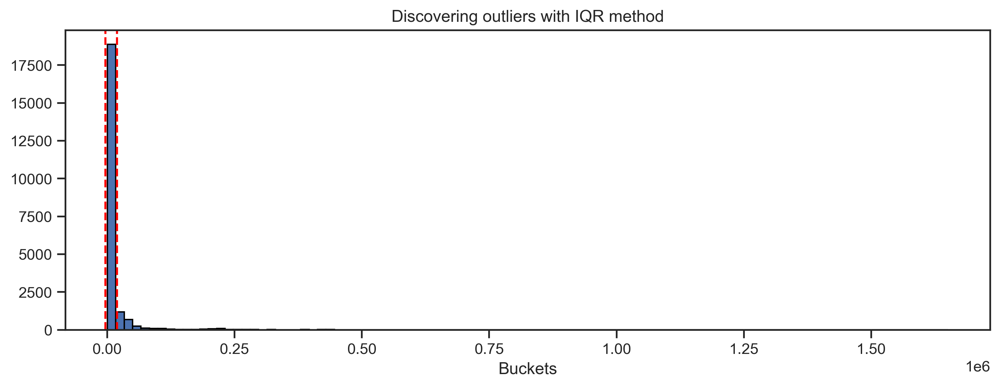

In [8]:
m = hs.sqft_lot
iqr = stats.iqr(m) 
print('IQR is:', iqr)
print('IQR Range + :', np.percentile(m, 75)+1.5*iqr)
print('IQR Range - :', np.percentile(m, 25)-1.5*iqr)
plt.figure(figsize=(12,4))
plt.hist(m,bins=100, edgecolor="black")
plt.title('Discovering outliers with IQR method')
plt.xlabel("Buckets")
# Vertical lines for each percentile of interest
plt.axvline(np.percentile(m, 75)+1.5*iqr, linestyle='--', color='red')
plt.axvline(np.percentile(m, 25)-1.5*iqr, linestyle='--', color='red')
plt.show()

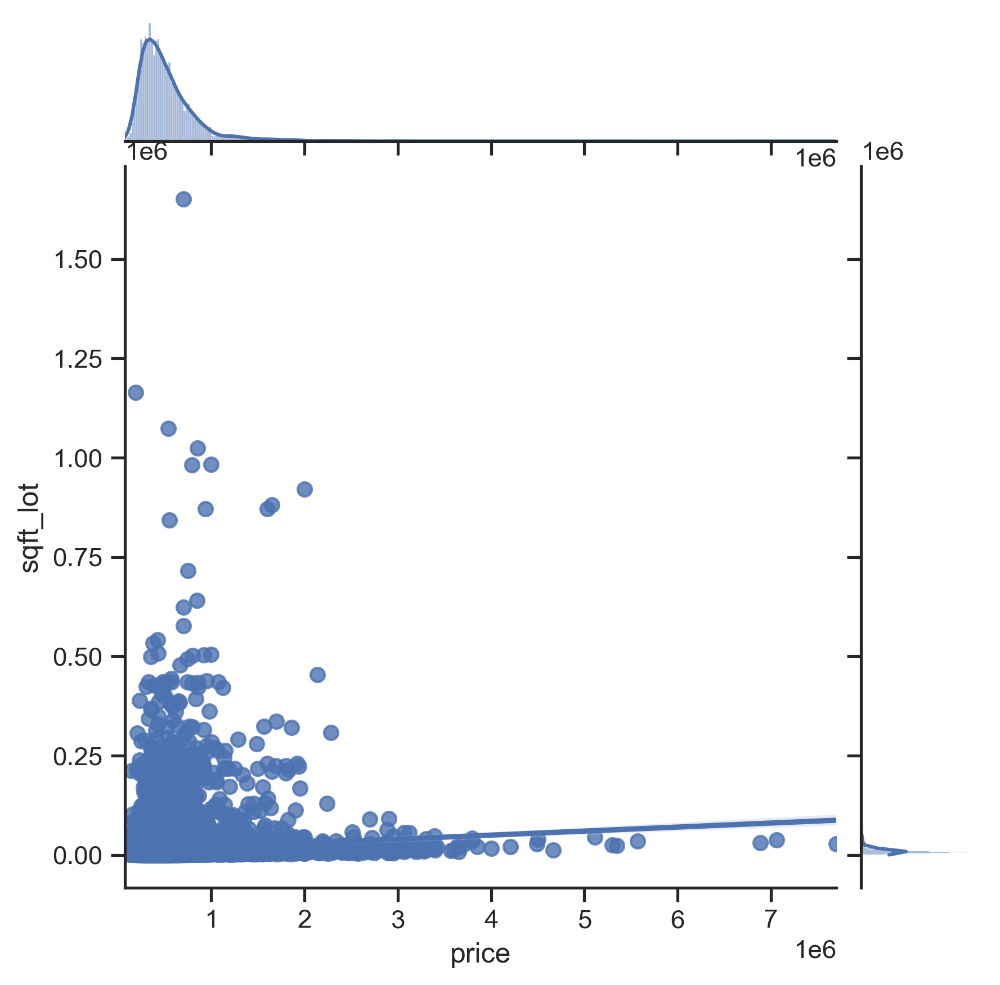

In [9]:
sns.jointplot("price", "sqft_lot", data=hs, kind='reg'); #"sqft_lot"
#https://www.landandfarm.com/property/34_Acres_M_L_Clarke_Co_IA_Industrial_Deveopment-8825379/

In [10]:
hs.nlargest(10, 'sqft_lot')

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
1719,700000.0,4.0,1.00,1300,1651359,1.0,4,6,1300,0,1920,0,2560,425581
17319,190000.0,2.0,1.00,710,1164794,1.0,2,5,710,0,1915,0,1680,16730
7647,542500.0,5.0,3.25,3010,1074218,1.5,5,8,2010,1000,1931,0,2450,68825
7769,855000.0,4.0,3.50,4030,1024068,2.0,3,10,4030,0,2006,0,1830,11700
3949,998000.0,NaN,3.25,3770,982998,2.0,3,10,3770,0,1992,0,2290,37141
4441,790000.0,2.0,3.00,2560,982278,1.0,3,8,2560,0,2004,0,1620,40946
6691,1998000.0,2.0,2.50,3900,920423,2.0,3,12,3900,0,2009,0,2720,411962
7077,1650000.0,4.0,3.25,3920,881654,3.0,3,11,3920,0,2002,0,2970,112384
9714,937500.0,4.0,4.00,5545,871200,2.0,3,11,3605,1940,2003,0,3420,871200
20452,1600000.0,4.0,5.50,6530,871200,2.0,3,11,6530,0,2008,0,1280,858132


#### Bedrooms
- There are houses with zero rooms ?  Replace them with nan. Impute later 
- Remove the 33 as I assume is an entry mistake (price is in the range 3 bedrooms houses) 

<AxesSubplot:xlabel='price'>

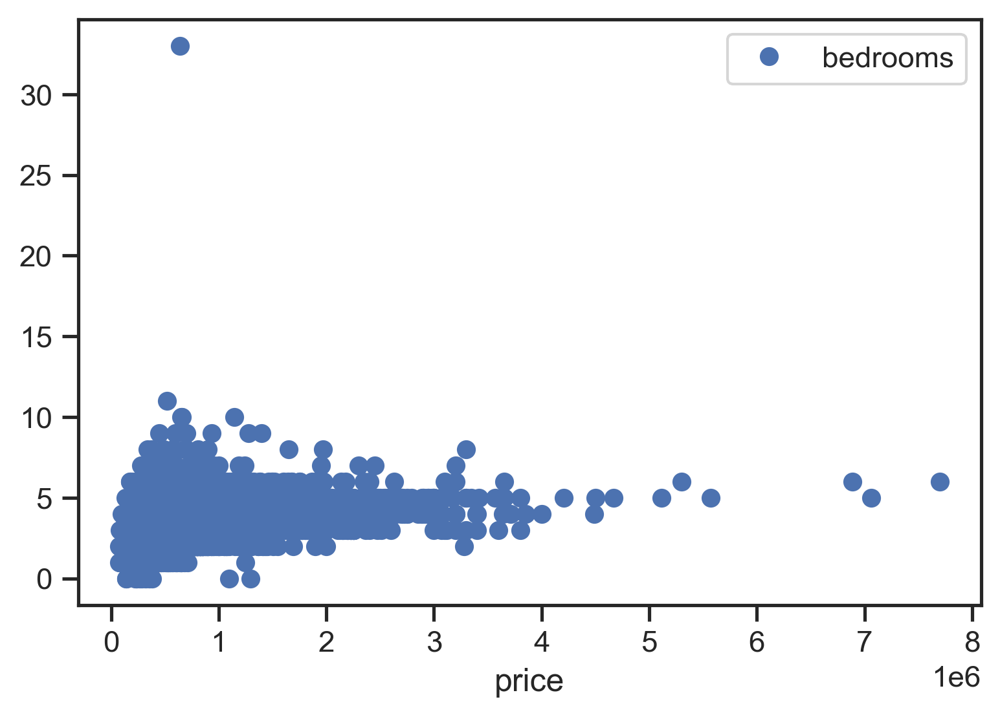

In [11]:
hs_zoom = pd.DataFrame(hs[['price','bedrooms']])
hs_zoom.plot('price','bedrooms', style = 'o')

In [12]:
rslt_df = hs.loc[hs['bedrooms'] == 0] 
rslt_df

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
875,1095000.0,0.0,0.00,3064,4764,3.5,3,7,3064,0,1990,0,2360,4000
3119,380000.0,0.0,0.00,1470,979,3.0,3,8,1470,0,2006,0,1470,1399
3467,288000.0,0.0,1.50,1430,1650,3.0,3,7,1430,0,1999,0,1430,1650
4868,228000.0,0.0,1.00,390,5900,1.0,2,4,390,0,1953,0,2170,6000
6994,1295650.0,0.0,0.00,4810,28008,2.0,3,12,4810,0,1990,0,4740,35061
8484,240000.0,0.0,2.50,1810,5669,2.0,3,7,1810,0,2003,0,1810,5685
9773,355000.0,0.0,0.00,2460,8049,2.0,3,8,2460,0,1990,0,2520,8050
9854,235000.0,0.0,0.00,1470,4800,2.0,3,7,1470,0,1996,0,1060,7200
12653,320000.0,0.0,2.50,1490,7111,2.0,3,7,1490,0,1999,0,1500,4675
14423,139950.0,0.0,0.00,844,4269,1.0,4,7,844,0,1913,0,1380,9600


In [13]:
hs['bedrooms'] = hs['bedrooms'].replace(0, np.nan)

In [14]:
hs['bedrooms'].mask(hs['bedrooms'] == 33, 3, inplace=True)
hs.groupby((hs['bedrooms']))['bedrooms'].count()

bedrooms
1.0      189
2.0     2600
3.0     9352
4.0     6526
5.0     1534
6.0      261
7.0       35
8.0       11
9.0        6
10.0       3
11.0       1
Name: bedrooms, dtype: int64

### Year built and renovated 

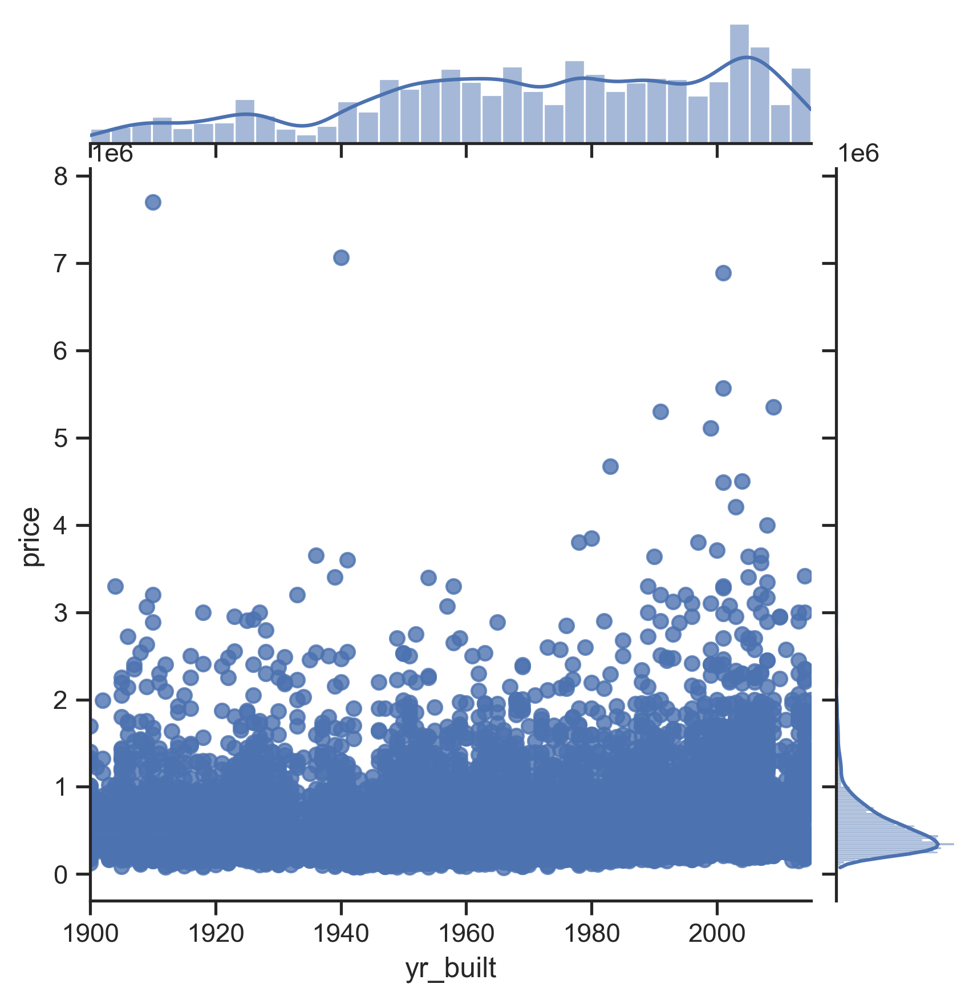

In [15]:
#sns.catplot(data=hs, x="yr_built", y='sqft_living')
sns.jointplot("yr_built","price", data=hs, kind='reg'); #"sqft_lot"

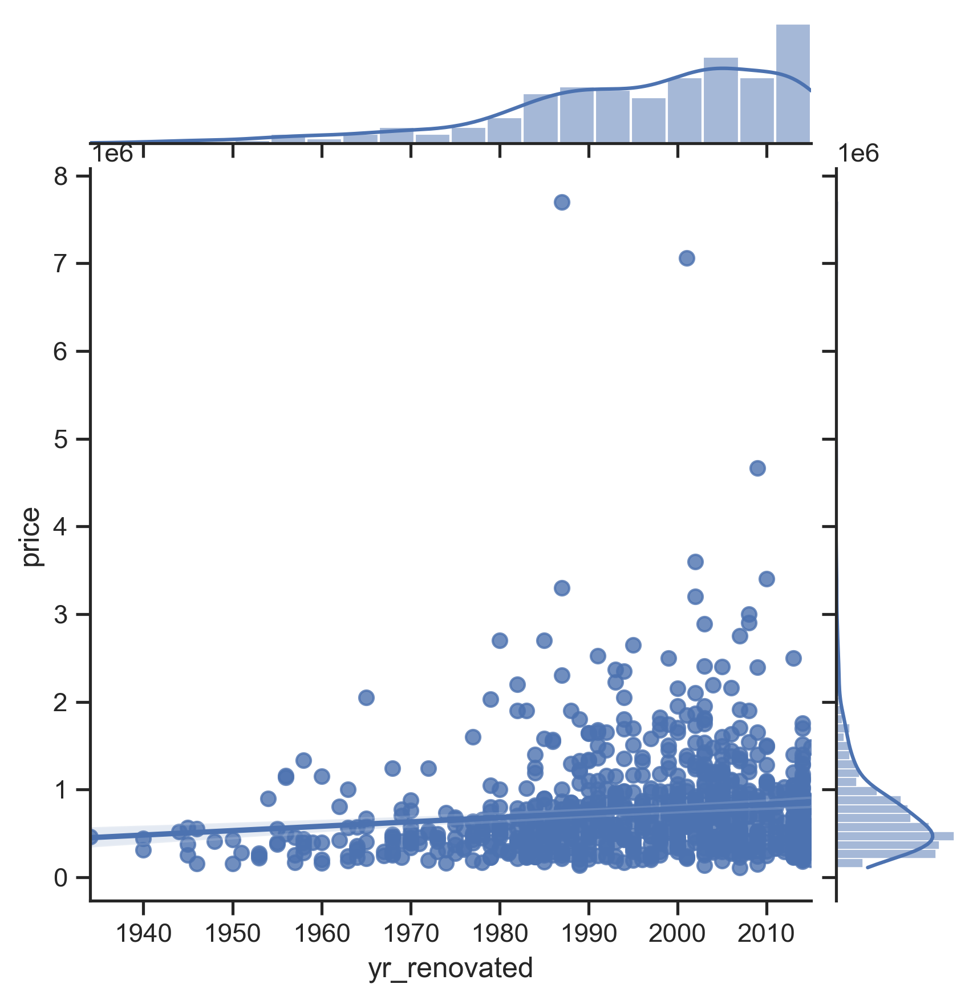

In [16]:
hs1 = hs[hs['yr_renovated'] >0]
sns.jointplot('yr_renovated',"price", data=hs1, kind='reg'); 

(array([ 852.,  868., 1163., 1234., 2713., 2938., 2805., 2585., 2861.,
        3591.]),
 array([1900. , 1911.5, 1923. , 1934.5, 1946. , 1957.5, 1969. , 1980.5,
        1992. , 2003.5, 2015. ]),
 <BarContainer object of 10 artists>)

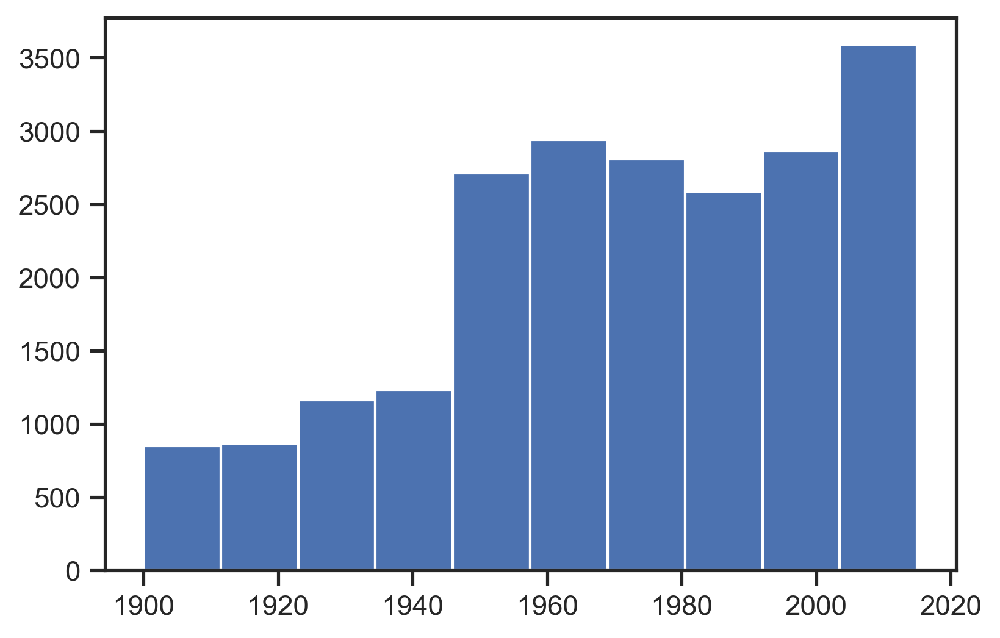

In [17]:
plt.hist(hs.yr_built)

#### sqft living = sqft_basement + sqft_living 
- that probably leads so perfect correlation. do check 

In [18]:
hs1 = hs.dropna()

In [19]:
# VIF dataframe 
vif_data = pd.DataFrame() 
vif_data["feature"] = hs1.columns 
vif_data["VIF"] = [variance_inflation_factor(hs1.values, i) 
                          for i in range(len(hs1.columns))] 
  
print(vif_data)

          feature         VIF
0           price    7.618587
1        bedrooms   25.315119
2       bathrooms   25.189528
3     sqft_living         inf
4        sqft_lot    2.404349
5          floors   16.429658
6       condition   30.992328
7           grade  155.040694
8      sqft_above         inf
9   sqft_basement         inf
10       yr_built  141.008529
11   yr_renovated    1.079249
12  sqft_living15   26.172362
13     sqft_lot15    2.624538


In [20]:
hs = hs.drop(['sqft_living'], axis=1)

#### Check grade

(array([1.000e+00, 0.000e+00, 3.000e+00, 2.900e+01, 2.420e+02, 2.038e+03,
        8.980e+03, 6.066e+03, 2.615e+03, 1.134e+03, 3.990e+02, 9.000e+01,
        1.300e+01]),
 array([ 1.        ,  1.92307692,  2.84615385,  3.76923077,  4.69230769,
         5.61538462,  6.53846154,  7.46153846,  8.38461538,  9.30769231,
        10.23076923, 11.15384615, 12.07692308, 13.        ]),
 <BarContainer object of 13 artists>)

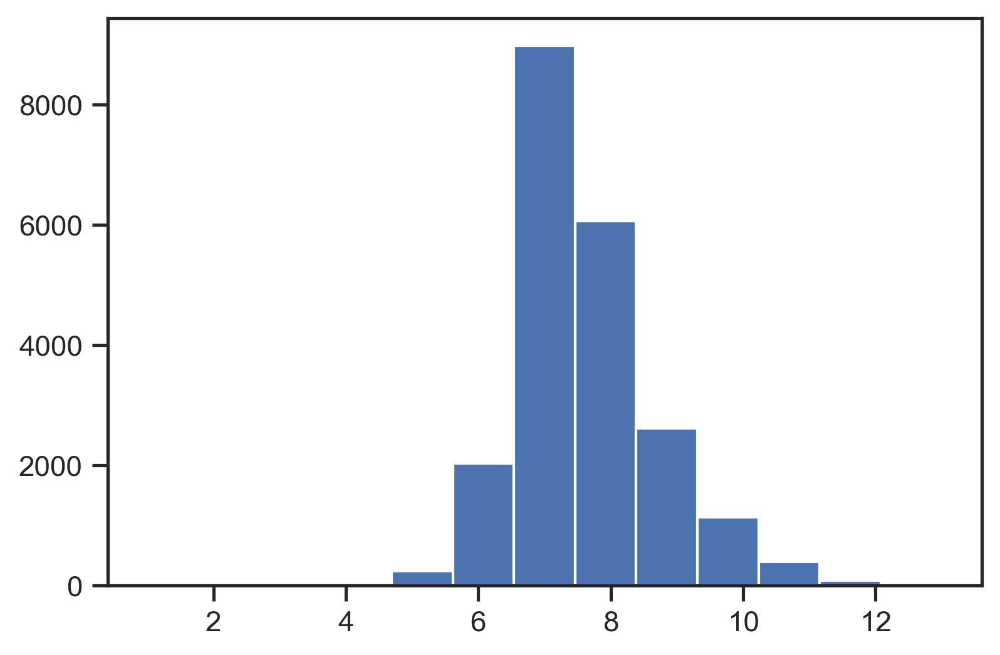

In [21]:
plt.hist(hs.grade, bins=13)

In [22]:
#Group grade - 1 to 3 in 1 and 11 to 13 into 13
hs.grade[hs.grade == 11] = 13
hs.grade[hs.grade == 12] = 13
hs.grade[hs.grade == 3] = 1
hs.grade[hs.grade == 4] = 1
hs.groupby('grade')['grade'].count()

grade
1       33
5      242
6     2038
7     8980
8     6066
9     2615
10    1134
13     502
Name: grade, dtype: int64

#### Log transform skewed/not normal continious dist columns

In [23]:
hs["price"] = np.log(hs["price"])
hs["sqft_lot"] = np.log(hs["sqft_lot"])
hs["sqft_living15"] = np.log(hs["sqft_living15"])
hs["sqft_lot15"] = np.log(hs["sqft_lot15"])
hs["sqft_above"] = np.log(hs["sqft_above"])
hs["sqft_basement"] = np.log(hs["sqft_basement"]+1) #has zeros - not basement

<module 'matplotlib.pyplot' from '/Users/sterngold/opt/anaconda3/lib/python3.8/site-packages/matplotlib/pyplot.py'>

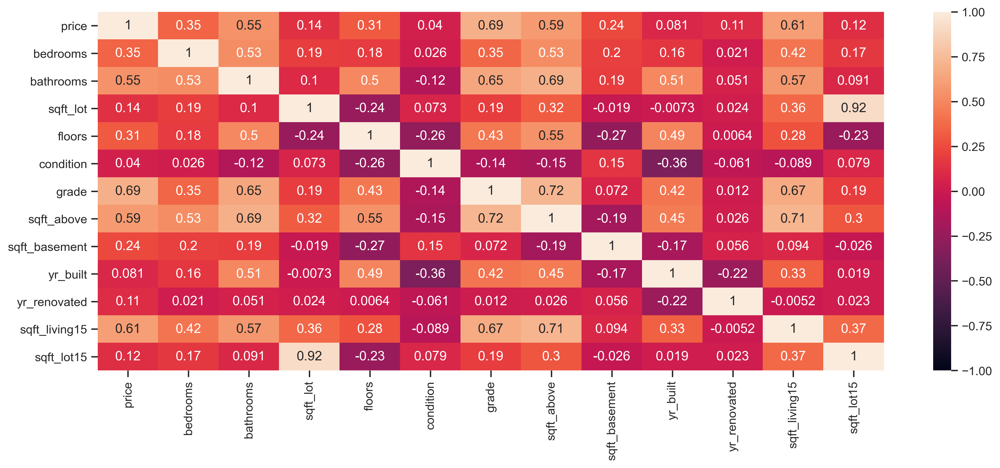

In [24]:
plt.figure(figsize=(16, 6))
sns.heatmap(hs.corr(), vmin=-1, vmax=1, annot=True)
plt

### Report on Data exploration / cleaning 

- Based on the observation and the understanding of the data I did the following actions
- Dropped column Unnamed as this seems to be the number row and is the same as index (nr. record) for each transaction in this case 
- Dropped the 3 null value rows in price column - as per ask as well 
- Drop columns waterfront and view as they had null values >70% - as per ask as well 
- Lot and Lot15 columns have outliers (low price/high sq ft), as those are the outside area of the houses and some of the houses seem to be farms (maybe). I assume it is good to figure out a way forward - for example adding the price of land as a feature in order to give meaning to those columns (probably price of land in city vs outside of city is different). Since a lot is not known, I will keep all the information but it is possible that this will decrease the value of the model. Maybe you can try to run a model without the biggest outliers. 
- The Bedroom column has NaN and a few rows with 0 rooms. I assume an entry mistake, thus all will be made NaN and dealt in the next stage (before modeling) where the values will be imputed (later in the assignment)/ Fixed as well one row that 33 rooms as the price was more like for 3 rooms house. 
- Dropped sqft_living as perfectly correlated with sqft Above and Basement - basically Above + Basement equals - Living. Kept Above and Basement as they hold more information for the house (I assume) 
- Change to log the continuous columns (all sq ft columns and price) as they are heavily skewed (not normal)This should help to normalise the data and bring it more to normal shape. Important to remember -  - they need to be restored to original values when reporting final results. 
- Grade column seems to be very unbalanced - very little grades in 1 to 3 levels and in 11 to 13. I have taken the note from the data description where 1 to 3 are called unsatisfactory and 11 to 13 are called outstanding grades and combined them to give the model better performance chances. Given the information about the grades , I assume we don’t lose much information

In [25]:
hs_grade = pd.DataFrame(hs)
hs_price = pd.DataFrame(hs)
hs_price_en = pd.DataFrame(hs)

# Task1: Grade 

## Split / Normalising /Feature Engineering
Apply pre-processing steps to your training and testing datasets separately in order to avoid data leakage.

In [26]:
X_,y = hs_grade.drop(['grade'], axis=1), hs_grade['grade']
X_, y = shuffle(X_, y)

In [27]:
X_train, X_test, y_train, y_test = train_test_split(X_, y, test_size=0.25, random_state=0)
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16207 entries, 890 to 5116
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          16207 non-null  float64
 1   bedrooms       15400 non-null  float64
 2   bathrooms      16207 non-null  float64
 3   sqft_lot       16207 non-null  float64
 4   floors         16207 non-null  float64
 5   condition      16207 non-null  int64  
 6   sqft_above     16207 non-null  float64
 7   sqft_basement  16207 non-null  float64
 8   yr_built       16207 non-null  int64  
 9   yr_renovated   16207 non-null  int64  
 10  sqft_living15  16207 non-null  float64
 11  sqft_lot15     16207 non-null  float64
dtypes: float64(9), int64(3)
memory usage: 1.6 MB


#### Grade: Check Imputer to decide whihc one to use 

- We have missing values (Nan) only in one column (bedrooms) and they are small % from the total column. I first checked the mean/std of the column with Nan values and then applied two imputers - both actually impute values via mean method. And then I checked if mean/std changes. As expected, due to very small number of rows missing,the numbers do not change significantly, thus any of the imputers will do (in this specific case, I choose Iterative Imputer)

In [28]:
X_train['bedrooms'].describe()

count    15400.000000
mean         3.374675
std          0.912715
min          1.000000
25%          3.000000
50%          3.000000
75%          4.000000
max         11.000000
Name: bedrooms, dtype: float64

In [29]:
imp = SimpleImputer(missing_values=np.nan, strategy='mean').fit(X_train)
X_mean_imp = imp.transform(X_train)
X_mean_imp1=pd.DataFrame(X_mean_imp)
X_mean_imp1[1].describe()

count    16207.000000
mean         3.374675
std          0.889700
min          1.000000
25%          3.000000
50%          3.000000
75%          4.000000
max         11.000000
Name: 1, dtype: float64

In [31]:
#imp1 = IterativeImputer(random_state=0).fit(X_train)
imp1 = SimpleImputer(missing_values=np.nan, strategy='mean').fit(X_train)
X_iter_imp = imp1.transform(X_train)
X_iter_imp1=pd.DataFrame(X_iter_imp)
X_iter_imp1[1].describe()

count    16207.000000
mean         3.374675
std          0.889700
min          1.000000
25%          3.000000
50%          3.000000
75%          4.000000
max         11.000000
Name: 1, dtype: float64

#### Data Normalization / Standartization Check 

- Standardized the data via RobustScaler method - I choose this one as this data has many outliers values which actually are important for the model but should not degrade the predictive quality. as per sklearn - "RobustScaler is "based on percentiles and are therefore not influenced by a few number of very large marginal outliers".

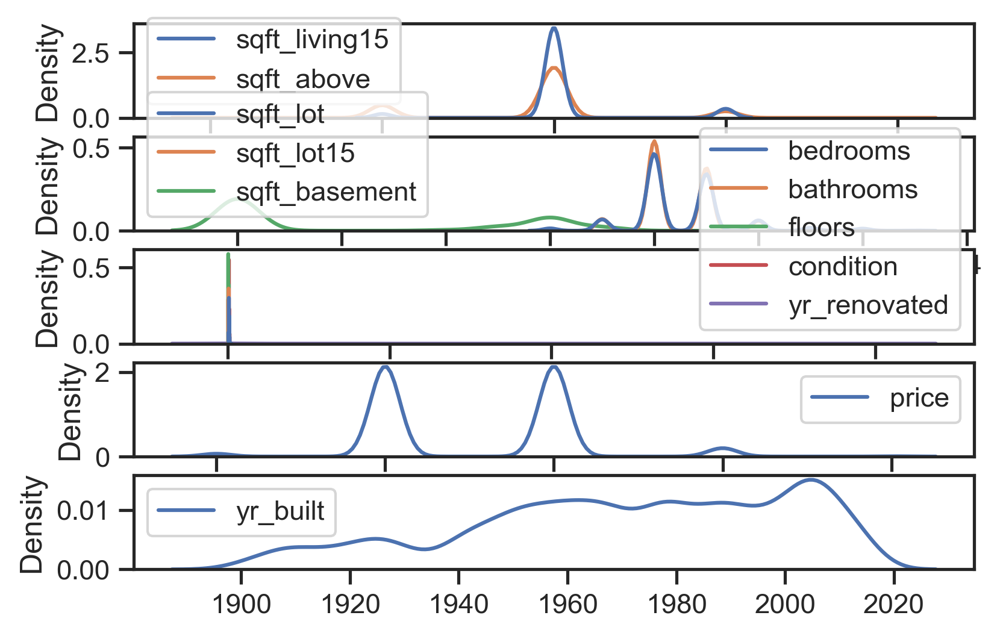

In [32]:
X_norm_df = pd.DataFrame(X_iter_imp.astype(np.int64), columns = X_train.columns.values)
X_norm_df.columns.values 

X_norm_df1 = X_norm_df[['sqft_living15','sqft_above']]
X_norm_df2 = X_norm_df[['sqft_lot', 'sqft_lot15', 'sqft_basement']]
X_norm_df3 = X_norm_df[[ 'bedrooms', 'bathrooms','floors', 'condition', 'yr_renovated']]
X_norm_df4 = X_norm_df[[ 'price']]
X_norm_df5 = X_norm_df[[ 'yr_built']]

fig, ax =plt.subplots(5,1)
sns.kdeplot(data = X_norm_df1, ax=ax[0])
sns.kdeplot(data = X_norm_df2, ax=ax[1])
sns.kdeplot(data = X_norm_df3, ax=ax[2])
sns.kdeplot(data = X_norm_df4, ax=ax[3])
sns.kdeplot(data = X_norm_df5, ax=ax[4])
fig.show()


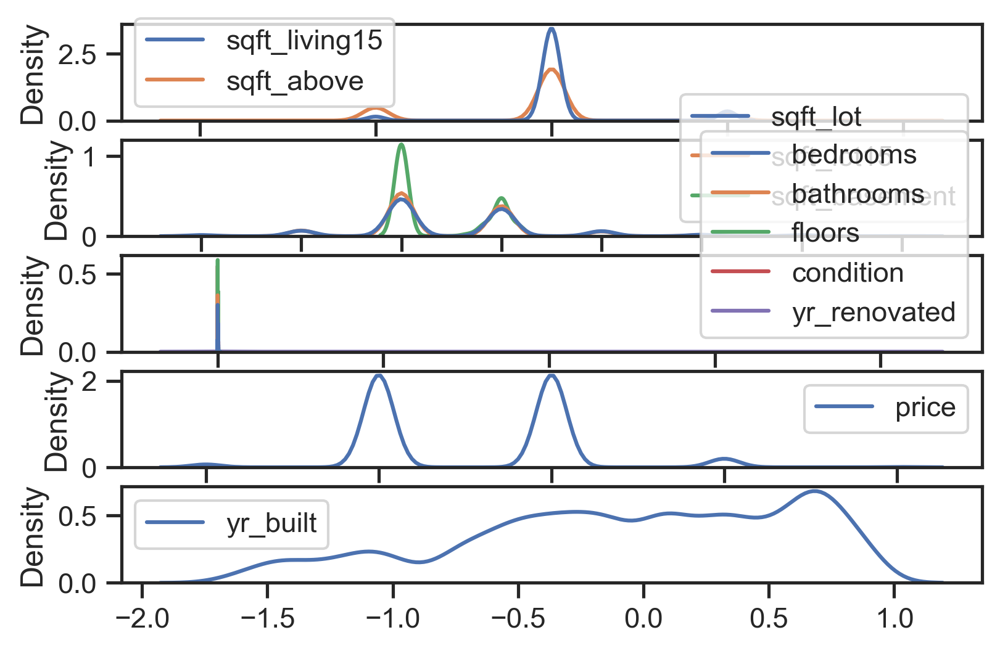

In [33]:
#scaler = Normalizer() 
#scaler = MinMaxScaler()
#scaler = StandardScaler()
scaler = RobustScaler()
#scaler = PowerTransformer()

scaled_df = scaler.fit_transform(X_norm_df)
scaled_df = pd.DataFrame(scaled_df,  columns = X_train.columns.values)

scaled_df1 = scaled_df[['sqft_living15','sqft_above']]
scaled_df2 = scaled_df[['sqft_lot', 'sqft_lot15', 'sqft_basement']]
scaled_df3 = scaled_df[[ 'bedrooms', 'bathrooms','floors', 'condition', 'yr_renovated']]
scaled_df4 = scaled_df[[ 'price']]
scaled_df5 = scaled_df[[ 'yr_built']]

fig, ax =plt.subplots(5,1)
sns.kdeplot(data = scaled_df1, ax=ax[0])
sns.kdeplot(data = scaled_df2, ax=ax[1])
sns.kdeplot(data = scaled_df3, ax=ax[2])
sns.kdeplot(data = scaled_df4, ax=ax[3])
sns.kdeplot(data = scaled_df5, ax=ax[4])
fig.show()

#### Grade: Feature selection Check 

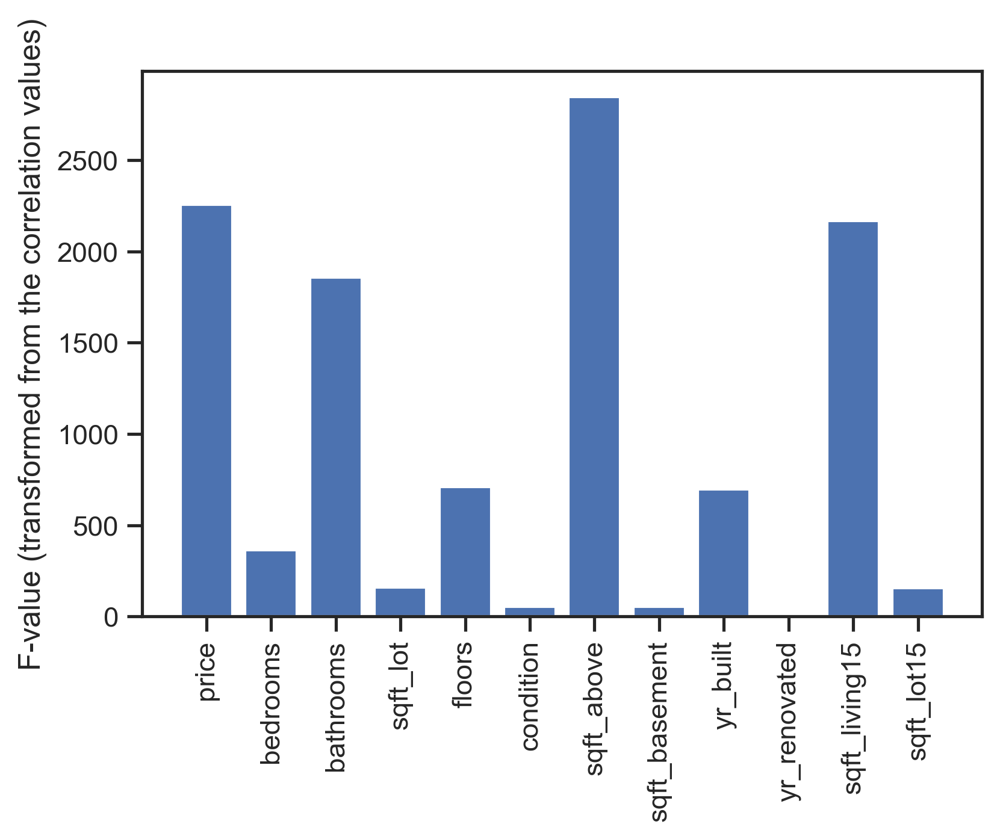

In [34]:
f_selector = SelectKBest(score_func=f_classif, k='all')
f_selector.fit(X_iter_imp, y_train)
x = [i for i in range(len(f_selector.scores_))]
plt.bar(x,f_selector.scores_)
labels = X_train.columns.values
plt.xticks(x, labels, rotation ='vertical')
plt.ylabel("F-value (transformed from the correlation values)")
plt.show()

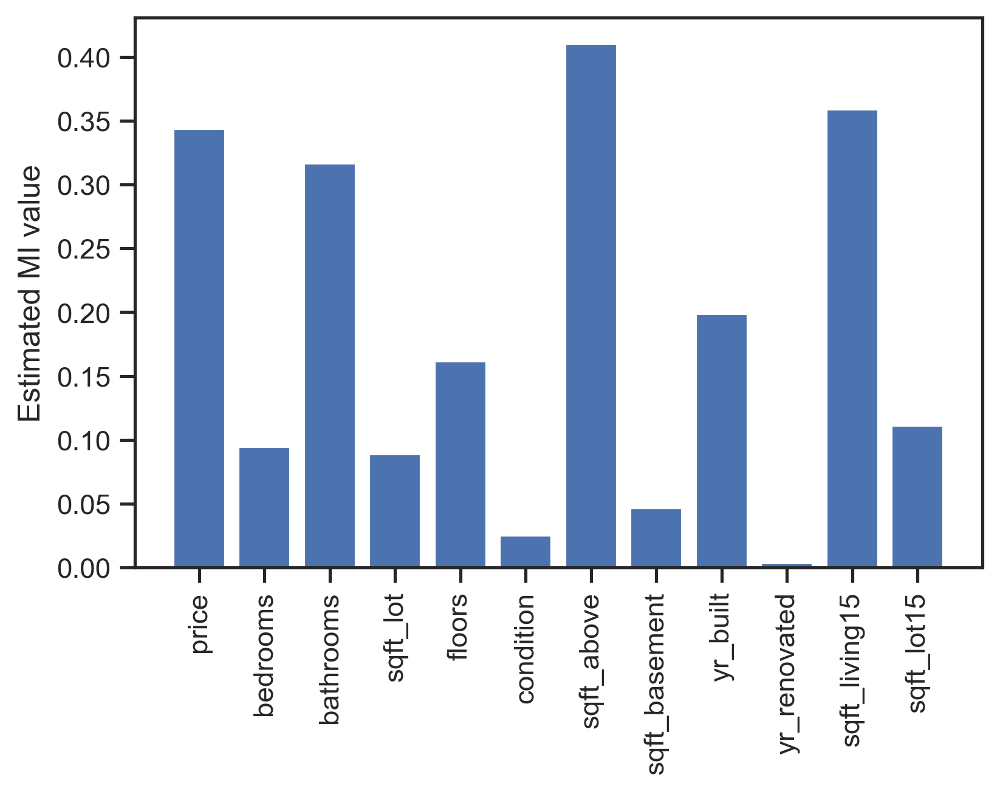

In [35]:
f_selector = SelectKBest(score_func=mutual_info_classif, k='all')
f_selector.fit(X_iter_imp, y_train)
x = [i for i in range(len(f_selector.scores_))]
plt.bar(x, f_selector.scores_)
plt.xticks(x, labels, rotation ='vertical')
plt.ylabel("Estimated MI value")
plt.show()

## Describe top 3 features: 
1. Sqft Above (6) - living area 
2. Sqft Living15 (10)- surounding houses
3. Price (0)

I will select all the features above 0.05 (( in total) as I assume those will be the most useful and hold the most information. 
- Renovation year seams to be put to 0 with no information, maybe because that are too little renovated houses to have any meaning full relationship.
- Condition is strange one as expected the be more useful as higher grade to higher condition but maybe condition is not well understood. need to check 

# Task 1: Grade

## Modeling: Classification

In [36]:
X,y = hs_grade.drop(['grade'], axis=1), hs_grade['grade']
X, y = shuffle(X, y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16207 entries, 2272 to 15926
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          16207 non-null  float64
 1   bedrooms       15377 non-null  float64
 2   bathrooms      16207 non-null  float64
 3   sqft_lot       16207 non-null  float64
 4   floors         16207 non-null  float64
 5   condition      16207 non-null  int64  
 6   sqft_above     16207 non-null  float64
 7   sqft_basement  16207 non-null  float64
 8   yr_built       16207 non-null  int64  
 9   yr_renovated   16207 non-null  int64  
 10  sqft_living15  16207 non-null  float64
 11  sqft_lot15     16207 non-null  float64
dtypes: float64(9), int64(3)
memory usage: 1.6 MB


### Grade: Selecting Imputer, features, scaler and CV method 

In [37]:
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
select = SelectKBest(k=9, score_func=f_classif)  
scaler = RobustScaler()
cv= 5 

### Grade: KNN

In [39]:
t0 = time()
knn_pipe = Pipeline(steps=[('imp', imp),('select', select),
                           ('scaler', scaler), ('classifier', KNeighborsClassifier())])
param_grid = [{'classifier__n_neighbors': range(10,21)}] 
grid_k = GridSearchCV(knn_pipe, param_grid, return_train_score=True, cv=cv, verbose=2,n_jobs=-1)
print('KNN Val score agg: {:.5f}'.format(np.mean(cross_val_score(grid_k, X_train, y_train, cv=cv, n_jobs=-1))))
grid_k.fit(X_train, y_train)
print('KNN Accuracy Train: {:.5f}'.format(grid_k.score(X_train, y_train)))
print('KNN Accuracy Test: {:.5f}'.format(grid_k.score(X_test, y_test)))
print("done in %0.3fs" % (time() - t0))

KNN Val score agg: 0.65663
Fitting 5 folds for each of 11 candidates, totalling 55 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done  55 out of  55 | elapsed:   10.3s finished


KNN Accuracy Train: 0.69063
KNN Accuracy Test: 0.65242
done in 57.025s


In [40]:
print("best parameters: {}".format(grid_k.best_params_))

best parameters: {'classifier__n_neighbors': 20}


### Grade: SVM

In [41]:
t0 = time()
svc_pipe = Pipeline(steps=[('imp', imp),('select', select),
                           ('scaler', scaler), ('classifier', SVC())])

param_grid = [{'classifier__kernel': ['rbf'], 'classifier__gamma': [1e-3, 1e-4],
                     'classifier__C': [1, 10, 100, 1000]}]

grid_k_svm_grade = GridSearchCV(svc_pipe, param_grid=param_grid, 
                                return_train_score=True, cv=cv, n_jobs=-1, verbose=2)
print('SVC Val score agg: {:.5f}'.format(np.mean(cross_val_score(grid_k_svm_grade, X_train, y_train, cv=cv, n_jobs=-1))))
grid_k_svm_grade.fit(X_train, y_train)
print('SVC Accuracy Train: {:.5f}'.format(grid_k_svm_grade.score(X_train, y_train)))
print('SVC Accuracy Test: {:.5f}'.format(grid_k_svm_grade.score(X_test, y_test)))
print("done in %0.3fs" % (time() - t0))

SVC Val score agg: 0.66064
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   45.1s
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:  1.0min finished


SVC Accuracy Train: 0.66669
SVC Accuracy Test: 0.64705
done in 252.308s


In [42]:
means = grid_k_svm_grade.cv_results_['mean_test_score']
stds = grid_k_svm_grade.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_k_svm_grade.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" 
      % (mean, std * 2, params))

0.581 (+/-0.010) for {'classifier__C': 1, 'classifier__gamma': 0.001, 'classifier__kernel': 'rbf'}
0.490 (+/-0.017) for {'classifier__C': 1, 'classifier__gamma': 0.0001, 'classifier__kernel': 'rbf'}
0.638 (+/-0.016) for {'classifier__C': 10, 'classifier__gamma': 0.001, 'classifier__kernel': 'rbf'}
0.581 (+/-0.010) for {'classifier__C': 10, 'classifier__gamma': 0.0001, 'classifier__kernel': 'rbf'}
0.651 (+/-0.023) for {'classifier__C': 100, 'classifier__gamma': 0.001, 'classifier__kernel': 'rbf'}
0.637 (+/-0.019) for {'classifier__C': 100, 'classifier__gamma': 0.0001, 'classifier__kernel': 'rbf'}
0.661 (+/-0.021) for {'classifier__C': 1000, 'classifier__gamma': 0.001, 'classifier__kernel': 'rbf'}
0.645 (+/-0.020) for {'classifier__C': 1000, 'classifier__gamma': 0.0001, 'classifier__kernel': 'rbf'}


In [62]:
print("best parameters: {}".format(grid_k_svm_grade.best_params_))

best parameters: {'classifier__C': 1000, 'classifier__gamma': 0.001, 'classifier__kernel': 'rbf'}


### Grade RForest  (1)
- start with hyperparameters search by randomly sampling to narrow down the options - decrease run time / narrow the options down (running with super small n iteration to save time). In normal situation would 
- run model with parameters from previous step, and since those above are randomly sampled, in this step I select a few numbers around the best parameter selection and gridsearch will select the best final parameters (since it runs all the combinations)

In [40]:
t0 = time()
rf_pipe_cv = Pipeline(steps=[('imp', imp),('select', select),
                           ('scaler', scaler), ('classifier', RandomForestClassifier())])

n_estimators = [int(x) for x in np.linspace(start = 100, stop = 500, num = 10)]
max_features = ['auto']
max_depth = [int(x) for x in np.linspace(10, 50, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]

random_grid = {'classifier__n_estimators': n_estimators,
               'classifier__max_features': max_features,
               'classifier__max_depth': max_depth,
               'classifier__min_samples_split': min_samples_split,
               'classifier__min_samples_leaf': min_samples_leaf,
               'classifier__bootstrap': bootstrap}
rf_random = RandomizedSearchCV(rf_pipe_cv, param_distributions = random_grid, n_iter = 10, cv = 3, verbose=2, random_state=42, n_jobs = -1)
rf_random.fit(X_train,y_train)
print("done in %0.3fs" % (time() - t0))

Fitting 3 folds for each of 10 candidates, totalling 30 fits
done in 97.361s


In [41]:
print("best parameters: {}".format(rf_random.best_params_))

best parameters: {'classifier__n_estimators': 366, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 1, 'classifier__max_features': 'auto', 'classifier__max_depth': 30, 'classifier__bootstrap': True}


In [43]:
t0 = time()
rf_pipe = Pipeline(steps=[('imp', imp),('select', select),
                           ('scaler', scaler), ('classifier', RandomForestClassifier())])
param_grid = [{'classifier__bootstrap': [True],
               'classifier__max_depth': [20,30],
               'classifier__max_features': [8,9,10],
               'classifier__min_samples_leaf': [1], 
               'classifier__min_samples_split': [4,5],
               'classifier__n_estimators': [200, 366, 400]
              }]
grid_k_rf = GridSearchCV(rf_pipe, param_grid, return_train_score=True, cv=cv, verbose=2, n_jobs=-1)
print('Val score agg: {:.5f}'.format(np.mean(cross_val_score(grid_k_rf, X_train, y_train, 
                                                              scoring='roc_auc', cv=cv, n_jobs=-1))))
grid_k_rf.fit(X_train, y_train)
print('Accuracy Train: {:.5f}'.format(grid_k_rf.score(X_train, y_train)))
print('Accuracy Test: {:.5f}'.format(grid_k_rf.score(X_test, y_test)))                    
print("done in %0.3fs" % (time() - t0))

Val score agg: 0.68872
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Accuracy Train: 0.98630
Accuracy Test: 0.69147
done in 4442.561s


In [44]:
print("best parameters: {}".format(grid_k_rf.best_params_))

best parameters: {'classifier__bootstrap': True, 'classifier__max_depth': 20, 'classifier__max_features': 8, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 5, 'classifier__n_estimators': 200}


### Grade RForest  (2)

In [28]:
from imblearn.under_sampling import RandomUnderSampler 
from sklearn.metrics import roc_auc_score
rus = RandomUnderSampler(random_state=42)
X_train, y_train = rus.fit_resample(X_train, y_train)

t0 = time()
rf1_pipe = Pipeline(steps=[('imp', imp),('select', select),
                           ('scaler', scaler), ('classifier', DecisionTreeClassifier())])
param_grid = [{
    'classifier__max_depth': np.linspace(10, 22, 25, endpoint=True), 
    'classifier__max_features': range(7,11)
    #'classifier__min_samples_split': np.linspace(1.0, 10)
              }]
grid_k_rf3 = GridSearchCV(rf1_pipe, param_grid, return_train_score=True, cv=cv, verbose=2, n_jobs=-1)
print('Val score agg: {:.5f}'.format(np.mean(cross_val_score(grid_k_rf3, X_train, y_train,  scoring='roc_auc',
                                                             cv=cv, n_jobs=-1))))
grid_k_rf3.fit(X_train, y_train)
print('Accuracy Train: {:.5f}'.format(grid_k_rf3.score(X_train, y_train)))
print('Accuracy Test: {:.5f}'.format(grid_k_rf3.score(X_test, y_test)))                
print("done in %0.3fs" % (time() - t0))

Val score agg: nan
Fitting 5 folds for each of 100 candidates, totalling 500 fits
Accuracy Train: 1.00000
Accuracy Test: 0.42125
done in 119.421s


In [34]:
X_train

,price,bedrooms,bathrooms,sqft_lot,floors,condition,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
0,12.608199,1.0,0.75,9.402612,1.0,3,6.327937,0.00000,1967,0,7.170120,9.863030
1,12.779873,1.0,0.75,10.412652,1.0,4,6.272877,0.00000,1950,0,7.948032,9.568784
2,11.849398,1.0,1.00,8.837826,1.0,4,6.593045,0.00000,1926,0,7.489971,8.983314
3,12.476100,1.0,0.75,9.471242,1.0,5,6.253829,0.00000,1920,0,7.200425,9.411892
4,12.206073,2.0,0.75,10.928884,1.0,4,6.659294,0.00000,1945,0,7.390181,10.336795
...,...,...,...,...,...,...,...,...,...,...,...,...
187,13.527828,4.0,2.75,9.540148,2.0,3,8.140316,0.00000,1995,0,8.086410,9.536113
188,13.604790,4.0,2.50,10.135036,2.0,3,8.095599,0.00000,1985,0,8.095599,10.135036
189,13.873779,4.0,5.25,9.599473,2.0,3,8.328451,0.00000,2005,0,8.398410,9.650078
190,13.993657,4.0,4.00,9.160835,2.0,3,8.119696,6.53814,1990,0,8.110728,9.152287


In [ ]:
print("best parameters: {}".format(grid_k_rf3.best_params_))

## Grade Model Evaluations on Test 

In [35]:
#KNN
y_pred = grid_k.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.09      0.78      0.17         9
           5       0.08      0.33      0.12        60
           6       0.22      0.45      0.30       485
           7       0.66      0.42      0.51      2280
           8       0.52      0.34      0.41      1515
           9       0.33      0.53      0.40       654
          10       0.27      0.44      0.34       270
          13       0.47      0.52      0.49       130

    accuracy                           0.42      5403
   macro avg       0.33      0.48      0.34      5403
weighted avg       0.51      0.42      0.44      5403



In [63]:
#SVM
y_pred = grid_k_svm_grade.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.50      0.38      0.43        13
           5       0.00      0.00      0.00        54
           6       0.67      0.50      0.57       496
           7       0.73      0.80      0.77      2275
           8       0.61      0.66      0.64      1512
           9       0.55      0.54      0.54       641
          10       0.55      0.39      0.46       290
          13       0.77      0.57      0.65       122

    accuracy                           0.66      5403
   macro avg       0.55      0.48      0.51      5403
weighted avg       0.66      0.66      0.66      5403



In [45]:
#RF
y_pred = grid_k_rf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         6
           5       0.41      0.15      0.22        61
           6       0.61      0.56      0.59       490
           7       0.77      0.81      0.79      2296
           8       0.66      0.69      0.68      1512
           9       0.58      0.56      0.57       621
          10       0.58      0.47      0.52       292
          13       0.71      0.56      0.63       125

    accuracy                           0.69      5403
   macro avg       0.54      0.47      0.50      5403
weighted avg       0.69      0.69      0.69      5403



In [30]:
#RF2
y_pred = grid_k_rf3.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.07      0.33      0.12         9
           5       0.06      0.42      0.11        60
           6       0.21      0.30      0.25       485
           7       0.65      0.45      0.53      2280
           8       0.48      0.42      0.45      1515
           9       0.32      0.37      0.34       654
          10       0.27      0.40      0.32       270
          13       0.46      0.67      0.55       130

    accuracy                           0.42      5403
   macro avg       0.32      0.42      0.33      5403
weighted avg       0.49      0.42      0.44      5403



# Report Grade Classification 

For all models in this assignment: 
In any case before going to modeling, I start with data exploration and cleaning. Once data is brought to a satisfactory level, in this case to be ready and most useful to test different algorithms, I split the data in train and test samples (even better will be to add validation set, but that is for the next assignment). Once that is done, I do choose the best imputer, standardize the data and check/select the features. I do all this on the train set in order to avoid data leaking. After deciding which imputer, standardization and features I will use, I built a pipeline to load all including the model. 

Once loaded, the pipe is put in Gridsearch CV and parameters for each algorithm are given as ranges, in order to find the best parameters. Note on the CV - there are many different methods to do cross -validation and I assume there are better ones (like KFold) but it takes long time to run any model on my machine and I still don’t have a good way to estimate the running time, thus I keep everywhere the CV=5 option but depending on the projects other validations should be tried. 

Once that is done, we run the search, and then fit on the train/test set where by design, Gridsearch applies the best parameters. After training, the best parameters are printed. Adjusting the parameters could continue until the best ones for the given task are found but I hope I have given reasonable ranges for each parameter in order to be able to select the best one. Here is my biggest struggle so far - finding the best parameters from zero. I have tried random searching for one of the RF models, however all this work takes a huge amount of time (my personal machine is just too slow for heavy tasks). I guess with constant practicing of modeling, one will become better at finding the best strategy. 


Last step is to evaluate the classification for each algorithm and their models. 
- Since we don’t have a specific task in mind to do with those labels, I would assume we want the model that returns the best classification defined as - high precision per label, all labels are returned. 
- With theDT RF models we get closer to the defined goal, still not all labels are returned but precision is higher compared to the other two. Still the RF seems to be performing much better on the training set and less so on the test set so we probably have underfitting in play. 

Further adjustments are needed but I believe we can get higher classification accuracy  
- The accuracy scores are not very useful here as they don’t give a good impression on how the model performs. 
- The SVM is probably very complex with such high C and very low gamma, thus not good at all (including it doesn't return one of the labels and is strange that is not the label where other models struggle. 
- Overall winner - DT Random Forest (1) 


# Task 2: Price Prediction & Classification 

### Split / Normalising /Feature Engineering

#### PricePred: Check Imputing

In [27]:
X_, y = hs_price.drop(['price'], axis=1), hs_price['price']
X_, y = shuffle(X_, y)
X_train, X_test, y_train, y_test = train_test_split(X_, y, test_size=0.25, random_state=0)
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16207 entries, 12784 to 3448
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bedrooms       15385 non-null  float64
 1   bathrooms      16207 non-null  float64
 2   sqft_lot       16207 non-null  float64
 3   floors         16207 non-null  float64
 4   condition      16207 non-null  int64  
 5   grade          16207 non-null  int64  
 6   sqft_above     16207 non-null  float64
 7   sqft_basement  16207 non-null  float64
 8   yr_built       16207 non-null  int64  
 9   yr_renovated   16207 non-null  int64  
 10  sqft_living15  16207 non-null  float64
 11  sqft_lot15     16207 non-null  float64
dtypes: float64(8), int64(4)
memory usage: 1.6 MB


#### PricePred: Feature selection check 

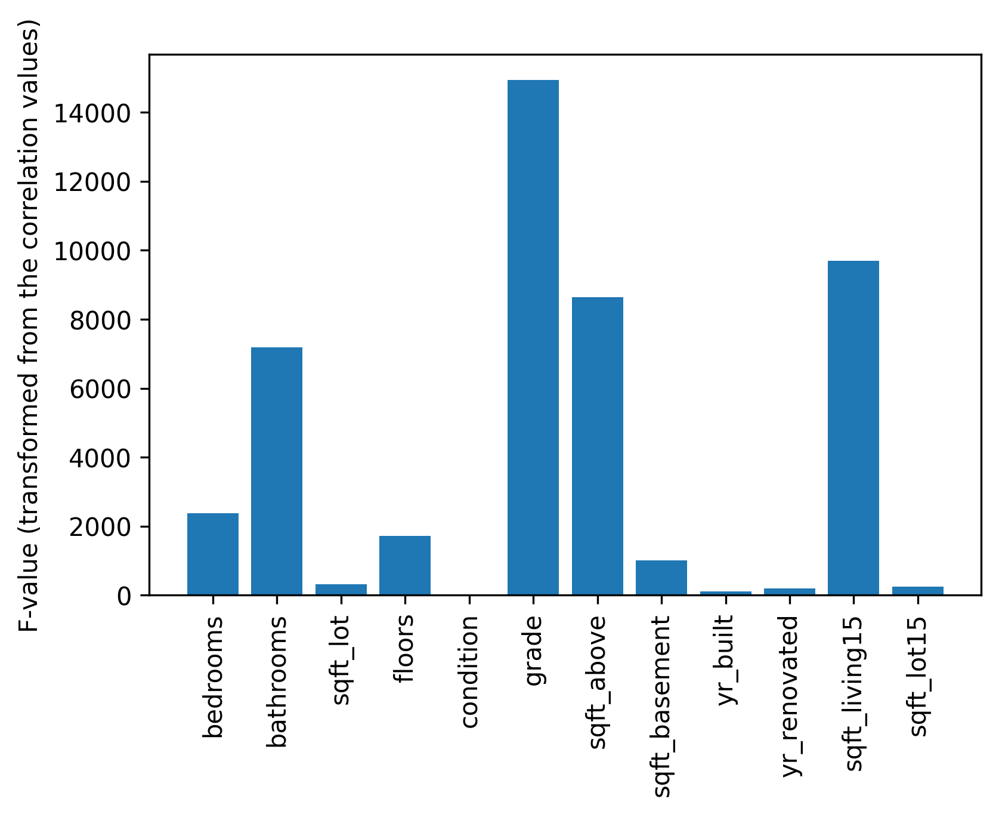

In [28]:
imp1 = IterativeImputer(random_state=0).fit(X_train)
X_iter_imp = imp1.transform(X_train)

f_selector = SelectKBest(score_func=f_regression, k='all')
f_selector.fit(X_iter_imp, y_train)
x=[i for i in range(len(f_selector.scores_))]
plt.bar(x, f_selector.scores_)
labels = X_train.columns.values
plt.xticks(x, labels, rotation ='vertical')
plt.ylabel("F-value (transformed from the correlation values)")
plt.show()

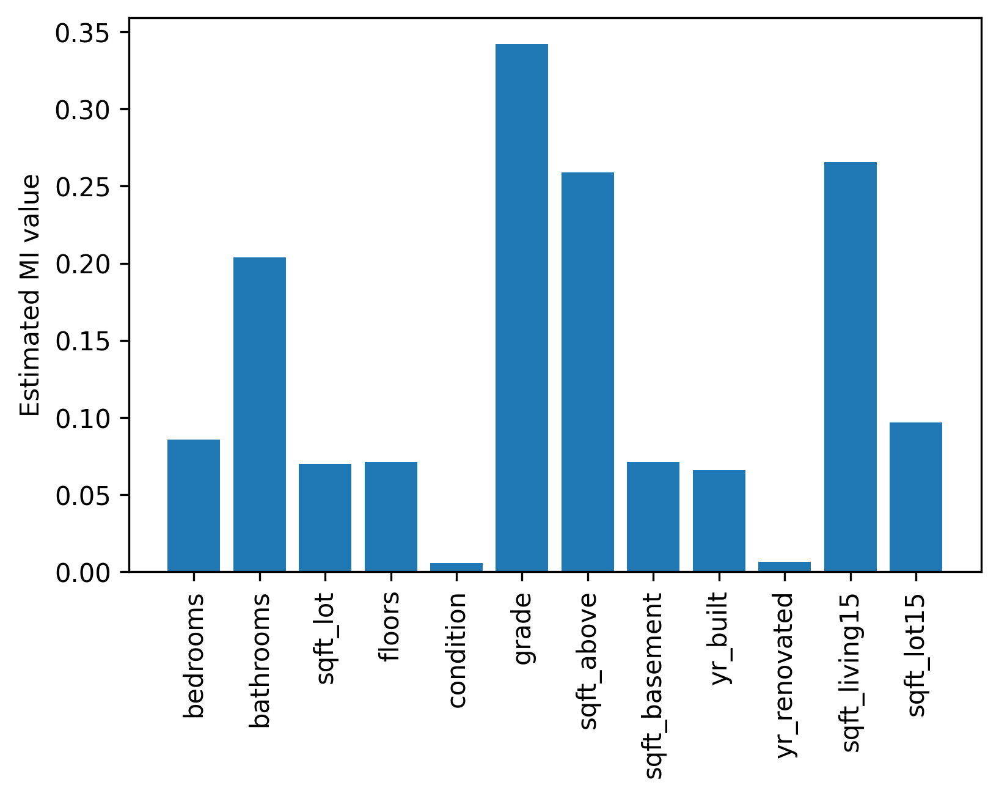

In [29]:
f_selector = SelectKBest(score_func=mutual_info_regression, k='all')
f_selector.fit(X_iter_imp, y_train)
x=[i for i in range(len(f_selector.scores_))]
plt.bar(x, f_selector.scores_)
plt.xticks(x, labels, rotation ='vertical')
plt.ylabel("Estimated MI value")
plt.show()

#### PricePred: Modeling - Ridge 

In [30]:
X, y = hs_price.drop(['price'], axis=1), hs_price['price']
X, y = shuffle(X, y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16207 entries, 2468 to 1997
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bedrooms       15380 non-null  float64
 1   bathrooms      16207 non-null  float64
 2   sqft_lot       16207 non-null  float64
 3   floors         16207 non-null  float64
 4   condition      16207 non-null  int64  
 5   grade          16207 non-null  int64  
 6   sqft_above     16207 non-null  float64
 7   sqft_basement  16207 non-null  float64
 8   yr_built       16207 non-null  int64  
 9   yr_renovated   16207 non-null  int64  
 10  sqft_living15  16207 non-null  float64
 11  sqft_lot15     16207 non-null  float64
dtypes: float64(8), int64(4)
memory usage: 1.6 MB


#### PricePred: Selecting Imputer, features, scaler and CV method 

In [31]:
imp = IterativeImputer(random_state=0)
select = SelectKBest(k= 10, score_func=f_regression)
scaler = RobustScaler()
cv= 5 

### PricePred: Ridge

In [39]:
t0 = time()
r_pipe = Pipeline(steps=[('imp', imp),('select', select),
                           ('scaler', scaler), 
                         ('poly', PolynomialFeatures(degree=3)),
                         ('classifier', Ridge(random_state=0))])
param_grid = [{
    'classifier__alpha': np.logspace(-1,6)
}] 
grid_k_ridge = GridSearchCV(r_pipe, param_grid, return_train_score=True, cv=cv, n_jobs=-1, verbose=2)
print('Ridge Val score agg: {:.5f}'.format(np.mean(cross_val_score(grid_k_ridge, X_train, y_train, cv=cv, n_jobs=-1))))
grid_k_ridge.fit(X_train, y_train)
print('Ridge Accuracy Train: {:.5f}'.format(grid_k_ridge.score(X_train, y_train)))
print('Ridge Accuracy Test: {:.5f}'.format(grid_k_ridge.score(X_test, y_test)))                  
print("done in %0.3fs" % (time() - t0))

Ridge Val score agg: 0.63175
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Ridge Accuracy Train: 0.65248
Ridge Accuracy Test: 0.63895
done in 237.221s


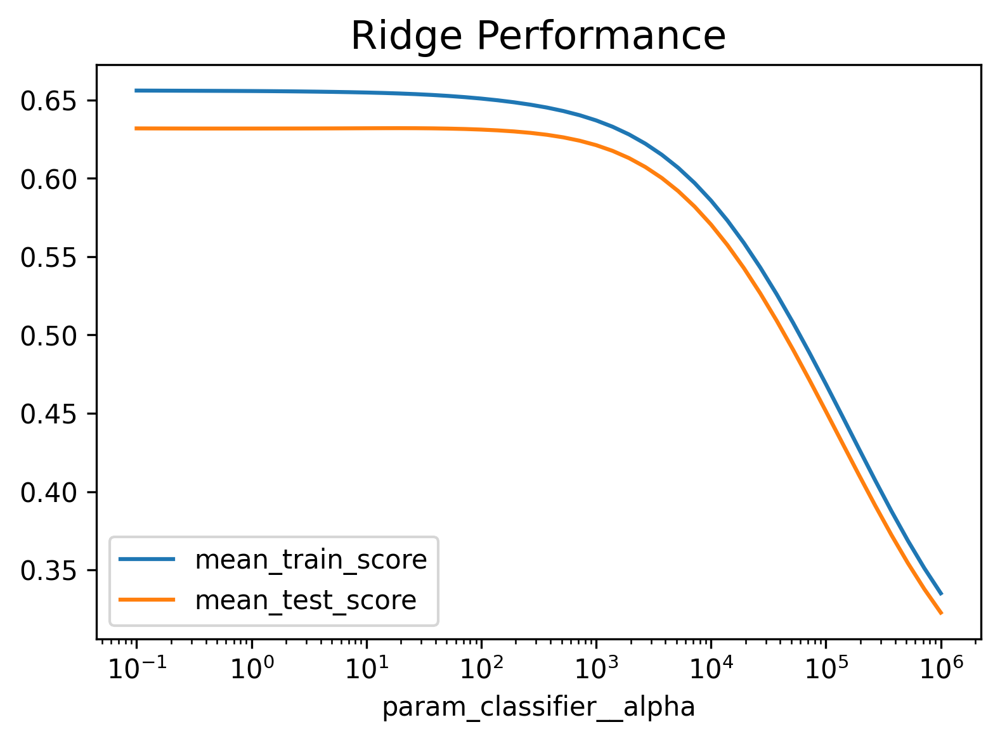

In [40]:
results = pd.DataFrame(grid_k_ridge.cv_results_)
results.plot('param_classifier__alpha', 'mean_train_score')
results.plot('param_classifier__alpha', 'mean_test_score', ax=plt.gca())
plt.title('Ridge Performance', size = 15)
plt.legend()
plt.xscale("log")

In [41]:
print("best parameters: {}".format(grid_k_ridge.best_params_))

best parameters: {'classifier__alpha': 19.306977288832496}


## Price Regression Evaluation on Test 

In [42]:
y_pred = grid_k_ridge.predict(X_test)

Text(0, 0.5, 'true')

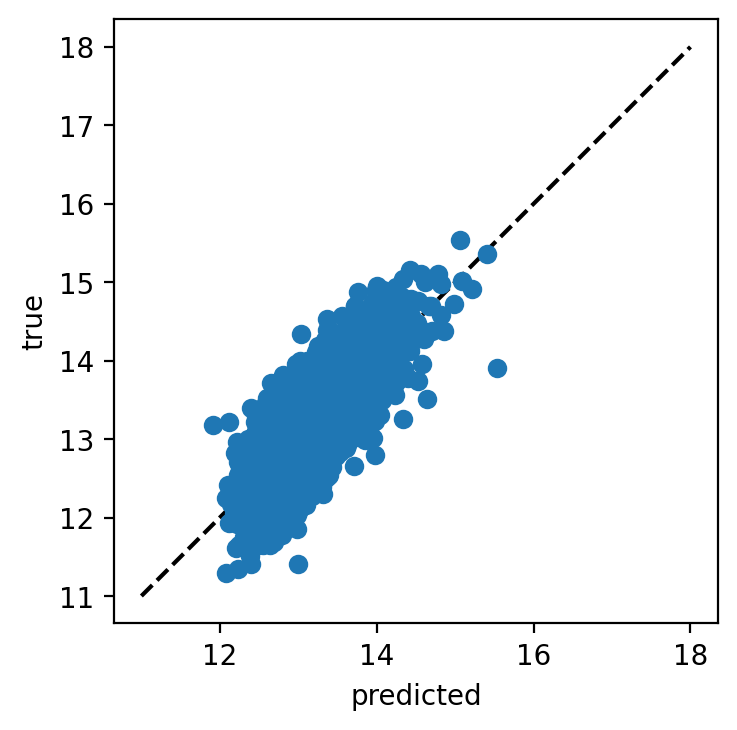

In [43]:
plt.figure(dpi=200)
plt.gca().set_aspect("equal")
plt.plot([11, 18], [11, 18], '--', c='k')
plt.plot(y_pred, y_test, 'o')
plt.xlabel("predicted")
plt.ylabel("true")

In [44]:
print("R-Square Value",r2_score(y_test,y_pred))
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R-Square Value 0.6389532840659791
mean_absolute_error : 0.24967522652784027
mean_squared_error :  0.10034301199926302
root_mean_squared_error :  0.31676965132294954


(array([   2.,    4.,   20.,   33.,   99.,  230.,  550.,  884., 1082.,
         879.,  720.,  479.,  238.,  112.,   49.,   15.,    5.,    0.,
           0.,    2.]),
 array([-1.31721161, -1.16995509, -1.02269857, -0.87544205, -0.72818553,
        -0.58092901, -0.43367249, -0.28641597, -0.13915945,  0.00809707,
         0.15535359,  0.30261011,  0.44986663,  0.59712315,  0.74437967,
         0.89163619,  1.03889271,  1.18614923,  1.33340575,  1.48066227,
         1.62791879]),
 <BarContainer object of 20 artists>)

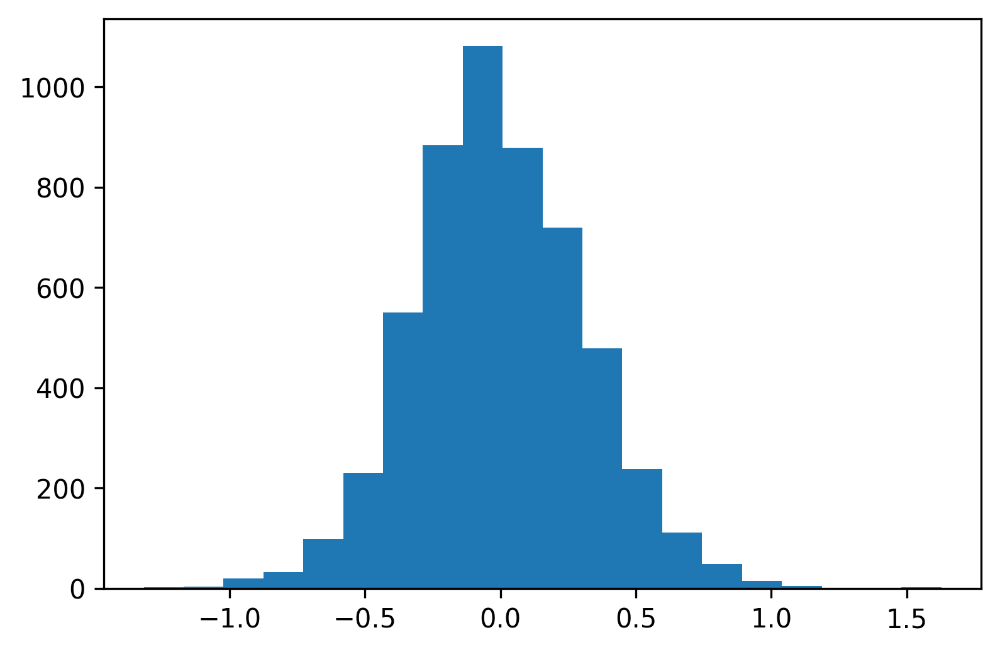

In [45]:
plt.hist(y_pred - y_test,bins=20)

## Price Classification (extra)

 #### Data pre-processing

In [47]:
bin_labels_3 = ['Low', 'Medium', 'High']
hs_price_en['price'] = pd.qcut(hs_price_en['price'], q=[0, 1/3, 2/3, 1], labels=bin_labels_3)

In [48]:
hs_price_en['price_encoded'] = hs_price_en['price'].map( {'Low':0, 'Medium':1, 'High':2})
hs_price_en['price_encoded'] = LabelEncoder().fit_transform(hs_price_en['price_encoded'])
hs_price_en[['price', 'price_encoded']] 

,price,price_encoded
0,Low,0
1,Medium,1
2,Low,0
3,High,2
4,Medium,1
...,...,...
21608,Low,0
21609,Medium,1
21610,Medium,1
21611,Medium,1


In [49]:
X,y = hs_price_en.drop(['price', 'price_encoded'], axis=1), hs_price_en['price_encoded']
X, y = shuffle(X, y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

#### PriceCLass: Prep

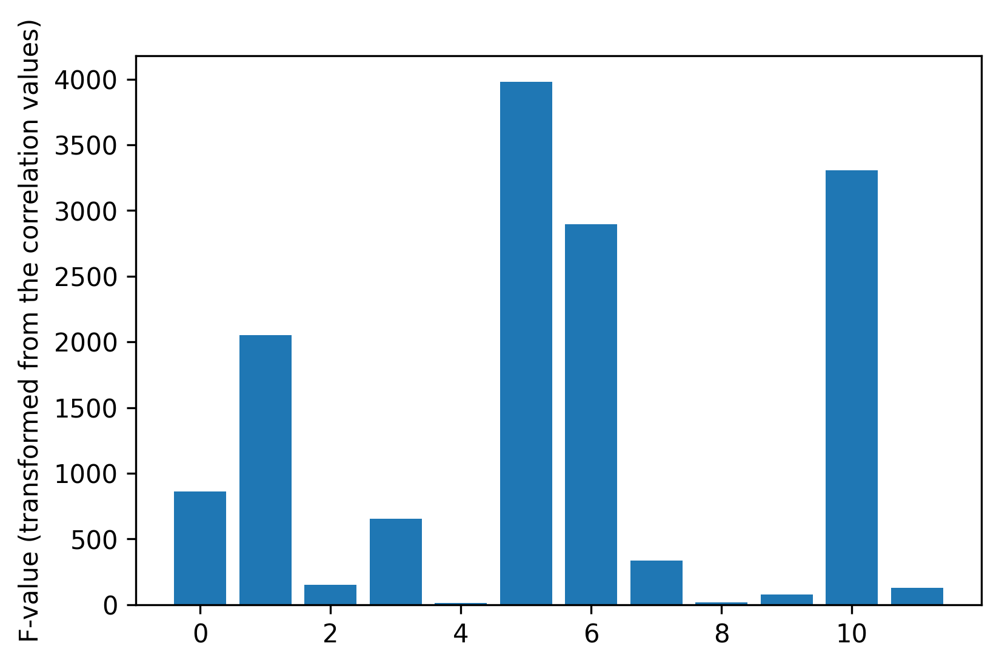

In [50]:
imp1 = IterativeImputer(random_state=0).fit(X_train)
X_iter_imp = imp1.transform(X_train)

f_selector = SelectKBest(score_func=f_classif, k='all')
f_selector.fit(X_iter_imp, y_train)
x=[i for i in range(len(f_selector.scores_))]
plt.bar(x, f_selector.scores_)
labels = X_train.columns.values
plt.ylabel("F-value (transformed from the correlation values)")
plt.show()

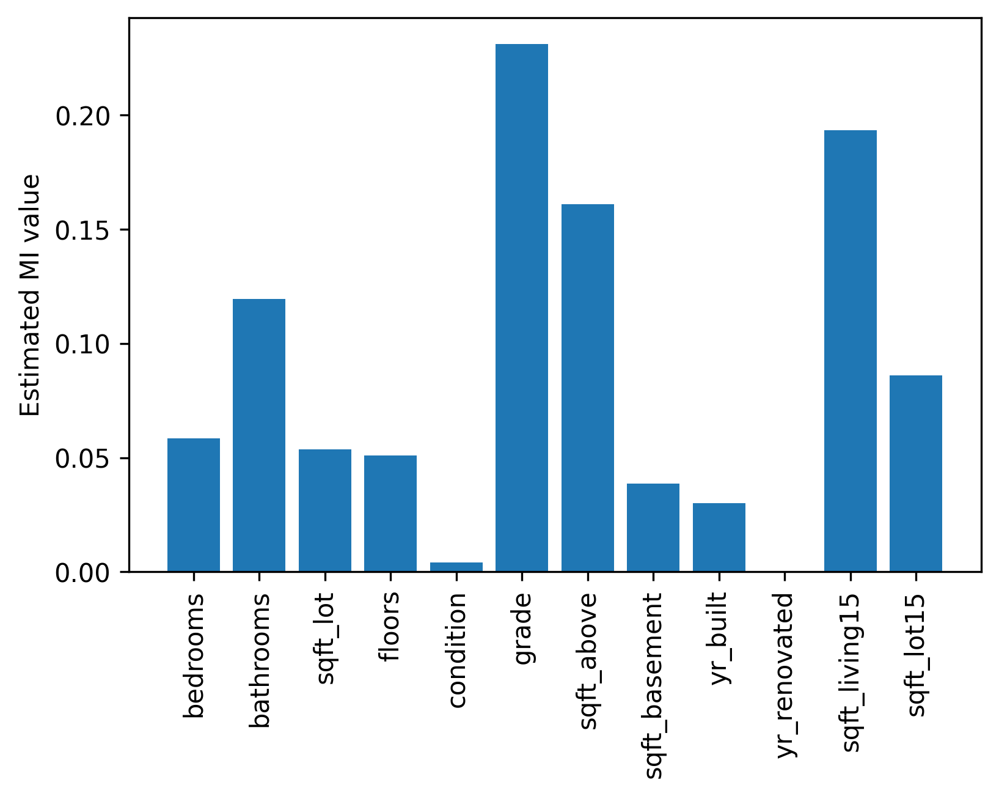

In [51]:
f_selector = SelectKBest(score_func=mutual_info_classif, k='all')
f_selector.fit(X_iter_imp, y_train)
x=[i for i in range(len(f_selector.scores_))]
plt.bar(x, f_selector.scores_)
plt.xticks(x, labels, rotation ='vertical')
plt.ylabel("Estimated MI value")
plt.show()

#### PriceClass: Modeling - Classification

In [52]:
imp = IterativeImputer(random_state=0)
select = SelectKBest(k=10, score_func=f_classif)
scaler = RobustScaler()
cv=5 

In [53]:
t0 = time()
svc_pipe = Pipeline(steps=[('imp', imp),('select', select),
                           ('scaler', scaler), ('classifier', SVC(random_state=42))])
param_grid = [{'classifier__kernel':['linear','rbf'], 
               'classifier__C':[0.001, 0.01, 0.1, 1, 10, 100],
               'classifier__gamma':[0.001, 0.01, 0.1, 1, 10, 100]
              }] 
grid_k_sv2 = GridSearchCV(svc_pipe, param_grid=param_grid, return_train_score=True, cv=cv, verbose=2, n_jobs=-1)
print('SVM Val score agg: {:.5f}'.format(np.mean(cross_val_score(grid_k_sv2, X_train, y_train, cv=cv, n_jobs=-1))))
grid_k_sv2.fit(X_train, y_train)
print('SVM Accuracy Train: {:.5f}'.format(grid_k_sv2.score(X_train, y_train)))
print('SVM Accuracy Test: {:.5f}'.format(grid_k_sv2.score(X_test, y_test)))

print("done in %0.3fs" % (time() - t0))

SVM Val score agg: 0.64892
Fitting 5 folds for each of 72 candidates, totalling 360 fits
SVM Accuracy Train: 0.68433
SVM Accuracy Test: 0.64686
done in 27612.179s


In [54]:
print("best parameters: {}".format(grid_k_sv2.best_params_))

best parameters: {'classifier__C': 10, 'classifier__gamma': 0.1, 'classifier__kernel': 'rbf'}


In [60]:
means = grid_k_sv2.cv_results_['mean_test_score']
stds = grid_k_sv2.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid_k_sv2.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" 
      % (mean, std * 2, params))

0.588 (+/-0.017) for {'classifier__C': 0.001, 'classifier__gamma': 0.001, 'classifier__kernel': 'linear'}
0.335 (+/-0.000) for {'classifier__C': 0.001, 'classifier__gamma': 0.001, 'classifier__kernel': 'rbf'}
0.588 (+/-0.017) for {'classifier__C': 0.001, 'classifier__gamma': 0.01, 'classifier__kernel': 'linear'}
0.337 (+/-0.004) for {'classifier__C': 0.001, 'classifier__gamma': 0.01, 'classifier__kernel': 'rbf'}
0.588 (+/-0.017) for {'classifier__C': 0.001, 'classifier__gamma': 0.1, 'classifier__kernel': 'linear'}
0.475 (+/-0.010) for {'classifier__C': 0.001, 'classifier__gamma': 0.1, 'classifier__kernel': 'rbf'}
0.588 (+/-0.017) for {'classifier__C': 0.001, 'classifier__gamma': 1, 'classifier__kernel': 'linear'}
0.335 (+/-0.000) for {'classifier__C': 0.001, 'classifier__gamma': 1, 'classifier__kernel': 'rbf'}
0.588 (+/-0.017) for {'classifier__C': 0.001, 'classifier__gamma': 10, 'classifier__kernel': 'linear'}
0.335 (+/-0.000) for {'classifier__C': 0.001, 'classifier__gamma': 10, 'cla

### PriceClass: DecisionTree

In [55]:
t0 = time()
rf_pipe = Pipeline(steps=[('imp', imp),('select', select),
                           ('scaler', scaler), ('classifier', DecisionTreeClassifier())])
param_grid = [{
    'classifier__max_depth': np.linspace(10, 22, 32, endpoint=True), 
    'classifier__max_features': range(7,12),   
    'classifier__min_samples_split': np.linspace(0.1, 1.0, 10)
              }]
grid_k_rf2 = GridSearchCV(rf_pipe, param_grid, return_train_score=True, cv=cv, verbose=2, n_jobs=-1)
print('Val score agg: {:.5f}'.format(np.mean(cross_val_score(grid_k_rf2, X_train, y_train, cv=cv, n_jobs=-1))))
grid_k_rf2.fit(X_train, y_train)
print('Accuracy Train: {:.5f}'.format(grid_k_rf2.score(X_train, y_train)))
print('Accuracy Test: {:.5f}'.format(grid_k_rf2.score(X_test, y_test)))                
print("done in %0.3fs" % (time() - t0))

Val score agg: 0.60566
Fitting 5 folds for each of 1600 candidates, totalling 8000 fits
Accuracy Train: 0.60752
Accuracy Test: 0.60577
done in 3584.469s


In [56]:
print("best parameters: {}".format(grid_k_rf2.best_params_))

best parameters: {'classifier__max_depth': 12.32258064516129, 'classifier__max_features': 7, 'classifier__min_samples_split': 0.1}


## Price Regression SVM and Forest Evaluation on Test 

In [57]:
y_pred = grid_k_sv2.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.65      0.71      0.68      1796
           1       0.52      0.48      0.50      1820
           2       0.77      0.75      0.76      1787

    accuracy                           0.65      5403
   macro avg       0.65      0.65      0.65      5403
weighted avg       0.64      0.65      0.64      5403



In [58]:
y_pred = grid_k_rf2.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.62      0.70      0.65      1796
           1       0.48      0.45      0.46      1820
           2       0.73      0.67      0.70      1787

    accuracy                           0.61      5403
   macro avg       0.61      0.61      0.61      5403
weighted avg       0.61      0.61      0.60      5403



# Report Price regression and classification 


#### For the Price Regression:
The setup for the model is similar to the one used in the Grade prediction. Same imputer, cross-validation and features are selected based on the mutual-information method. I think the used standardization of data is good for this regression too.
Since the model has been chosen already, I gave range for the alpha and applied gridsearch CV to find the best parameters. Polynomial features are added, with degree 2 by default to increase the regression performance (adding extra features). Best is to test a few degrees to see how much it improves (keeping an eye on overfitting). 
The accuracy of the train and test are very close thus I can assume that model fits  well (no over/under fitting). However the outcome is fairly low - about 4 out of 10 are wrongly predicted. All validation metrics point to not such a good model, if accuracy is what we are looking for. Again the goodness of the model will depend on the task - here I will assume we want a high prediction score. 

##### For Price classification
The linear SVM is not well suited for the task. Thus I’ve added kernel:rbf and would expect (confirmed) to perform better. Random Forest model didn;t do better but I would expect if I spend more time on tuning the parameters to achieve better results. 

For both: 
In terms of precision and recall, the lower and the top percentile (groups) have better scores where the middle group which probably is pretty big and less defined has a lower score. 


### For the assignment I used various sources of information: 
- all relevant lectures and code from UvA MBA class 
- https://scikit-learn.org/stable/index.html
- https://seaborn.pydata.org/introduction.html
- various treads on https://stackoverflow.com/
- https://medium.com/topic/data-science - https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74

In [1]:

# knn imputation strategy and prediction for the hose colic dataset
from numpy import nan
from pandas import read_csv
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import KNNImputer
from sklearn.pipeline import Pipeline
# load dataset
url = 'https://raw.githubusercontent.com/jbrownlee/Datasets/master/horse-colic.csv'
dataframe = read_csv(url, header=None, na_values='?')
# split into input and output elements
data = dataframe.values
ix = [i for i in range(data.shape[1]) if i != 23]
X, y = data[:, ix], data[:, 23]
# create the modeling pipeline
pipeline = Pipeline(steps=[('i', KNNImputer(n_neighbors=21)), ('m', RandomForestClassifier())])
# fit the model
pipeline.fit(X, y)
# define new data
row = [2, 1, 530101, 38.50, 66, 28, 3, 3, nan, 2, 5, 4, 4, nan, nan, nan, 3, 5, 45.00, 8.40, nan, nan, 2, 11300, 00000, 00000, 2]
# make a prediction
yhat = pipeline.predict([row])
# summarize prediction
print('Predicted Class: %d' % yhat[0])

Predicted Class: 2


In [6]:
data.shape[1]

28